## RNN SCENARIO 2 POD Microservice

In [1]:
#pip install plotly==5.1.0
#at command line execute: 
# conda activate otumba
# conda install scikit-learn scipy matplotlib
# conda install nbformat
# conda install tqdm

In [5]:
import plotly.graph_objects as go 
import numpy as np 
import pandas as pd 

In [6]:
training_filename = 'dataset_1000000_50_1.cvs'
valid_filename = 'dataset_100000_110_1.cvs'
# Data from production
prod_filename  = 'dataset_100000_50_2.cvs'

In [7]:
train = pd.read_csv(training_filename)
valid = pd.read_csv(valid_filename)
prod = pd.read_csv(prod_filename)
train.head()

,pods,file_descriptors,receive_packets,transmit_packets,dropped_packets,cpu_usage_seconds,cpu_throttled_seconds,memory_working_bytes,memory_usage_bytes,load,date
0,1.0,0.0,0.0,0.0,0.0,0.000350,0.0,0.0,2.0,50,2021-08-17 16:39:26.690067
1,1.0,0.0,0.0,0.0,0.0,0.000350,0.0,0.0,2.0,50,2021-08-17 16:39:26.732453
2,1.0,0.0,0.0,0.0,0.0,0.000350,0.0,0.0,2.0,50,2021-08-17 16:39:26.776369
3,1.0,0.0,0.0,0.0,0.0,0.000351,0.0,0.0,2.0,50,2021-08-17 16:39:26.820005
4,1.0,0.0,0.0,0.0,0.0,0.000351,0.0,0.0,2.0,50,2021-08-17 16:39:26.862225


# Standardize Data

In [8]:
from sklearn.preprocessing import StandardScaler
def parse_and_standardize(df: pd.DataFrame, scaler: StandardScaler = None):
    df['timestamp'] = pd.to_datetime(df['date'])
    df['stand_value'] = df['cpu_throttled_seconds']
    if not scaler:
        scaler = StandardScaler()
        scaler.fit(df['stand_value'].values.reshape(-1, 1))
    df['stand_value'] = scaler.transform(df['stand_value'].values.reshape(-1, 1))
    return scaler

data_scaler = parse_and_standardize(train)
parse_and_standardize(valid, data_scaler)

parse_and_standardize(prod, data_scaler)

StandardScaler()

In [9]:
layout = dict(xaxis=dict(title='Timestamp'), yaxis=dict(title='CPU Utilization')) 
fig = go.Figure(layout=layout) 
fig.add_trace(go.Scatter(x=train['timestamp'], y=train['cpu_throttled_seconds'], 
                         mode='markers', name='Train Non-anomaly',
                         marker=dict(color='blue')))

In [10]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=valid['timestamp'], y=valid['cpu_throttled_seconds'], 
                         mode='markers', name='Valid Non-anomaly',
                         marker=dict(color='blue')))

## LSTM Long Short-Term Memory

In [11]:
import torch 
import torch.nn as nn
import torch.optim as opt
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader 

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [13]:
class CPUDataset(Dataset):
    def __init__(self, data: pd.DataFrame, size: int):
        self.chunks = torch.FloatTensor(data['stand_value']).unfold(0, size, size)
        
    def __len__(self):
        return self.chunks.size(0)
    
    def __getitem__(self, i):
        x = self.chunks[i]
        return x

train_ds = CPUDataset(train, 64)
valid_ds = CPUDataset(valid, 64)
prod_ds  = CPUDataset(prod, 64)

In [14]:
class LSTMModel(nn.Module):
    def __init__(self, in_size, hidden_size, out_size, device):
        super().__init__()
        self.hidden_size = hidden_size
        self.lstm = nn.LSTM(in_size, hidden_size)
        self.linear = nn.Linear(hidden_size, out_size)
        self.device = device
        self.init_hidden()
        
    def forward(self, x):
        out, self.hidden_state = self.lstm(
            x.view(len(x), 1, -1), self.hidden_state
        )
        self.hidden_state = tuple(
            [h.detach() for h in self.hidden_state]
        )
        out = out.view(len(x), -1)
        out = self.linear(out)
        return out
    
    def init_hidden(self):
        self.hidden_state = (
            torch.zeros((1, 1, self.hidden_size)).to(self.device),
            torch.zeros((1, 1, self.hidden_size)).to(self.device))

In [15]:
def train_model(model: LSTMModel, dataloaders: dict, optimizer: opt.Optimizer, 
                scheduler, criterion, device: torch.device, epochs: int):
    losses_data = {'train': [], 'valid': []}
    model.to(device)
    for epoch in tqdm(range(epochs)):
        print(f'Epoch {epoch}/{epochs-1}')
        for phase in ['train', 'valid']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.
            running_total = 0.
            
        # Here changes start
            for idx, sequence in enumerate(dataloaders[phase]):
                value = sequence
                value = value.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    out = model(value.view(-1, 1))
                    loss = criterion(out.view(-1), value.view(-1))
        # Here changes end

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        scheduler.step()

                running_loss += loss.item() * out.size(0)
                running_total += out.size(0)

            epoch_loss = running_loss / running_total
            print(f'{phase.capitalize()} Loss: {epoch_loss}')
            losses_data[phase].append(epoch_loss)
    return losses_data

In [16]:
epochs = 50
model = LSTMModel(1, 128, 1, device)
dataloaders = {
    'train': DataLoader(train_ds, batch_size=1),
    'valid': DataLoader(valid_ds, batch_size=1)
}
optim = opt.Adam(params=model.parameters(), lr=1e-3)
sched = opt.lr_scheduler.OneCycleLR(
  optimizer=optim, max_lr=1e-3, steps_per_epoch=len(dataloaders['train']), epochs=epochs
)
criterion = nn.MSELoss()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [17]:
losses = train_model(model, dataloaders, optim, sched, criterion, device, epochs)

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 0/49


  2%|▏         | 1/50 [00:01<01:37,  2.00s/it]

Train Loss: 0.9052374248185201
Valid Loss: 2.8838127907362763
Epoch 1/49


  4%|▍         | 2/50 [00:04<01:36,  2.02s/it]

Train Loss: 0.2790674536151183
Valid Loss: 1.480952545703969
Epoch 2/49


  6%|▌         | 3/50 [00:06<01:34,  2.01s/it]

Train Loss: 0.1588413434910947
Valid Loss: 0.5728784710445937
Epoch 3/49


  8%|▊         | 4/50 [00:08<01:33,  2.04s/it]

Train Loss: 0.055876941284606275
Valid Loss: 0.09744755714037122
Epoch 4/49


 10%|█         | 5/50 [00:10<01:31,  2.02s/it]

Train Loss: 0.03545855088852689
Valid Loss: 0.5003505654610587
Epoch 5/49


 12%|█▏        | 6/50 [00:12<01:29,  2.04s/it]

Train Loss: 0.08978561291580256
Valid Loss: 0.8092606422975401
Epoch 6/49


 14%|█▍        | 7/50 [00:14<01:27,  2.03s/it]

Train Loss: 0.06910960364116425
Valid Loss: 0.2941528245338744
Epoch 7/49


 16%|█▌        | 8/50 [00:16<01:24,  2.01s/it]

Train Loss: 0.036903576040016206
Valid Loss: 0.5598698915064673
Epoch 8/49


 18%|█▊        | 9/50 [00:18<01:21,  1.99s/it]

Train Loss: 0.05364174902577277
Valid Loss: 0.441435134347914
Epoch 9/49


 20%|██        | 10/50 [00:20<01:19,  1.98s/it]

Train Loss: 0.048800226359568356
Valid Loss: 0.5649446767129391
Epoch 10/49


 22%|██▏       | 11/50 [00:22<01:17,  1.98s/it]

Train Loss: 0.03977833328700923
Valid Loss: 0.4470826717090075
Epoch 11/49


 24%|██▍       | 12/50 [00:23<01:14,  1.97s/it]

Train Loss: 0.02976950739054546
Valid Loss: 0.5841092537396734
Epoch 12/49


 26%|██▌       | 13/50 [00:25<01:13,  1.98s/it]

Train Loss: 0.03579573938736034
Valid Loss: 0.5012044485361904
Epoch 13/49


 28%|██▊       | 14/50 [00:27<01:11,  1.99s/it]

Train Loss: 0.028078128227217072
Valid Loss: 0.4533309029332277
Epoch 14/49


 30%|███       | 15/50 [00:30<01:10,  2.01s/it]

Train Loss: 0.019009761841980898
Valid Loss: 0.19552930275411576
Epoch 15/49


 32%|███▏      | 16/50 [00:32<01:07,  2.00s/it]

Train Loss: 0.013673820393088136
Valid Loss: 0.29270755056132874
Epoch 16/49


 34%|███▍      | 17/50 [00:33<01:04,  1.97s/it]

Train Loss: 0.015490197364212584
Valid Loss: 0.4527023986119079
Epoch 17/49


 36%|███▌      | 18/50 [00:35<01:02,  1.94s/it]

Train Loss: 0.02964114457719561
Valid Loss: 0.4120467318258738
Epoch 18/49


 38%|███▊      | 19/50 [00:37<01:00,  1.94s/it]

Train Loss: 0.01576992917311553
Valid Loss: 0.31314866936173485
Epoch 19/49


 40%|████      | 20/50 [00:39<00:58,  1.95s/it]

Train Loss: 0.01289498033162059
Valid Loss: 0.217735208000748
Epoch 20/49


 42%|████▏     | 21/50 [00:41<00:56,  1.94s/it]

Train Loss: 0.012554741458981283
Valid Loss: 0.2696262648326965
Epoch 21/49


 44%|████▍     | 22/50 [00:43<00:54,  1.93s/it]

Train Loss: 0.010195335709636358
Valid Loss: 0.2338488550104566
Epoch 22/49


 46%|████▌     | 23/50 [00:45<00:51,  1.92s/it]

Train Loss: 0.014913895581774224
Valid Loss: 0.32901191817360875
Epoch 23/49


 48%|████▊     | 24/50 [00:47<00:50,  1.94s/it]

Train Loss: 0.01720779118287666
Valid Loss: 0.22670808929662092
Epoch 24/49


 50%|█████     | 25/50 [00:49<00:48,  1.94s/it]

Train Loss: 0.012049540440678724
Valid Loss: 0.3096113229595488
Epoch 25/49


 52%|█████▏    | 26/50 [00:51<00:46,  1.96s/it]

Train Loss: 0.015698413674435082
Valid Loss: 0.2434838280656145
Epoch 26/49


 54%|█████▍    | 27/50 [00:53<00:44,  1.95s/it]

Train Loss: 0.011382942419352273
Valid Loss: 0.25174583129143935
Epoch 27/49


 56%|█████▌    | 28/50 [00:55<00:42,  1.95s/it]

Train Loss: 0.010333540841909154
Valid Loss: 0.081066020530351
Epoch 28/49


 58%|█████▊    | 29/50 [00:57<00:40,  1.95s/it]

Train Loss: 0.005168489884094892
Valid Loss: 0.21187020180661711
Epoch 29/49


 60%|██████    | 30/50 [00:59<00:38,  1.95s/it]

Train Loss: 0.012573468418072886
Valid Loss: 0.26383994116942117
Epoch 30/49


 62%|██████▏   | 31/50 [01:01<00:37,  1.95s/it]

Train Loss: 0.011509211000059638
Valid Loss: 0.12117750804106903
Epoch 31/49


 64%|██████▍   | 32/50 [01:03<00:35,  1.95s/it]

Train Loss: 0.006033856152038178
Valid Loss: 0.17426327897926602
Epoch 32/49


 66%|██████▌   | 33/50 [01:05<00:33,  1.99s/it]

Train Loss: 0.008943384115547445
Valid Loss: 0.09302976175336315
Epoch 33/49


 68%|██████▊   | 34/50 [01:07<00:32,  2.03s/it]

Train Loss: 0.0033737494016055215
Valid Loss: 0.046973145966136304
Epoch 34/49


 70%|███████   | 35/50 [01:09<00:30,  2.04s/it]

Train Loss: 0.0017945608016020696
Valid Loss: 0.023255008351973857
Epoch 35/49


 72%|███████▏  | 36/50 [01:11<00:28,  2.04s/it]

Train Loss: 0.0005333058301332377
Valid Loss: 0.0012842149165951304
Epoch 36/49


 74%|███████▍  | 37/50 [01:13<00:26,  2.04s/it]

Train Loss: 0.00024892186314702064
Valid Loss: 0.009962944446008998
Epoch 37/49


 76%|███████▌  | 38/50 [01:15<00:24,  2.03s/it]

Train Loss: 0.00040459059410075733
Valid Loss: 0.006490418942026937
Epoch 38/49


 78%|███████▊  | 39/50 [01:17<00:22,  2.00s/it]

Train Loss: 0.0003904732135637011
Valid Loss: 0.02308997789829311
Epoch 39/49


 80%|████████  | 40/50 [01:19<00:19,  1.97s/it]

Train Loss: 0.0023536251009638703
Valid Loss: 0.019448213252926318
Epoch 40/49


 82%|████████▏ | 41/50 [01:21<00:17,  1.99s/it]

Train Loss: 0.0009594062601165762
Valid Loss: 0.008873341409750055
Epoch 41/49


 84%|████████▍ | 42/50 [01:23<00:15,  1.97s/it]

Train Loss: 0.0007469189386259357
Valid Loss: 0.0009990339862649218
Epoch 42/49


 86%|████████▌ | 43/50 [01:25<00:13,  1.96s/it]

Train Loss: 0.0001485429927767298
Valid Loss: 0.0032708849602101375
Epoch 43/49


 88%|████████▊ | 44/50 [01:27<00:11,  1.98s/it]

Train Loss: 0.0002288849001696642
Valid Loss: 0.0009640159960548008
Epoch 44/49


 90%|█████████ | 45/50 [01:29<00:10,  2.01s/it]

Train Loss: 0.00010393776498594168
Valid Loss: 0.00042618163440637344
Epoch 45/49


 92%|█████████▏| 46/50 [01:31<00:07,  2.00s/it]

Train Loss: 5.3274392365673506e-05
Valid Loss: 0.0005240761176939459
Epoch 46/49


 94%|█████████▍| 47/50 [01:33<00:05,  1.99s/it]

Train Loss: 5.399886136141054e-05
Valid Loss: 0.0004198269813262033
Epoch 47/49


 96%|█████████▌| 48/50 [01:35<00:03,  1.99s/it]

Train Loss: 4.7446301747458494e-05
Valid Loss: 0.00039877968346960387
Epoch 48/49


 98%|█████████▊| 49/50 [01:37<00:01,  1.98s/it]

Train Loss: 4.6108129511866244e-05
Valid Loss: 0.00035368849686099837
Epoch 49/49


100%|██████████| 50/50 [01:39<00:00,  1.98s/it]

Train Loss: 4.1681431534684834e-05
Valid Loss: 0.00032510726571491555


In [18]:
train_values = train['stand_value'].values.astype(np.float32).flatten()
valid_values = valid['stand_value'].values.astype(np.float32).flatten()

prod_values  = prod['stand_value'].values.astype(np.float32).flatten()

# Evaluation mode

In [19]:
model.eval()

LSTMModel(
  (lstm): LSTM(1, 128)
  (linear): Linear(in_features=128, out_features=1, bias=True)
)

In [20]:
if torch.cuda.is_available():
   model.cuda()

In [21]:
with torch.no_grad():
    res_train = model(torch.tensor(train_values).to(device))
res_train = res_train.cpu()

In [22]:
with torch.no_grad():
    res_valid = model(torch.tensor(valid_values).to(device))
res_valid = res_valid.cpu()

In [23]:
with torch.no_grad():
    res_prod = model(torch.tensor(prod_values).to(device))
res_prod = res_prod.cpu()

## Errors Calculation

In [24]:
def calculate_prediction_errors(target, predicted, criterion):
    reconstruction_errors = []
    for t, p in zip(target, predicted):
        reconstruction_errors = np.append(
            reconstruction_errors, 
            criterion(p, t).cpu().numpy().flatten()
        )
    return reconstruction_errors

train_pred_errors = calculate_prediction_errors(
    res_train.view(-1), torch.tensor(train_values).view(-1), criterion
)
valid_pred_errors = calculate_prediction_errors(
    res_valid.view(-1), torch.tensor(valid_values).view(-1), criterion
)



prod_pred_errors = calculate_prediction_errors(
    res_prod.view(-1), torch.tensor(prod_values).view(-1), criterion
)

## Dynamic Threshold

In [25]:
window = 20
std_coef= 6

train_pred_errors_windowed = pd.Series(train_pred_errors).rolling(window=window, min_periods=1)
train_dynamic_threshold = train_pred_errors_windowed.mean() + std_coef * train_pred_errors_windowed.std()

valid_pred_errors_windowed = pd.Series(valid_pred_errors).rolling(window=window, min_periods=1)
valid_dynamic_threshold = valid_pred_errors_windowed.mean() + std_coef * valid_pred_errors_windowed.std()


prod_pred_errors_windowed = pd.Series(prod_pred_errors).rolling(window=window, min_periods=1)
prod_dynamic_threshold = prod_pred_errors_windowed.mean() + std_coef * prod_pred_errors_windowed.std()

## Metric Calculation

In [26]:
from sklearn.metrics import precision_recall_fscore_support

def calculate_metrics(
    ground_truth: pd.DataFrame, anomalies_idxs: list
    ):
    predictions = pd.DataFrame(
        index=range(len(ground_truth)), 
        columns=['anomaly_predicted']
    )
    predictions['anomaly_predicted'] = 0
    predictions.iloc[anomalies_idxs] = 1
    
    # Calculation of the confusion matrix can be done using pandas
    confusion_matrix = pd.crosstab(
        ground_truth.loc[:, 'anomaly_label'],
        predictions['anomaly_predicted'], 
        margins=True
    )
    precision, recall, f1, _ = precision_recall_fscore_support(
        ground_truth.loc[:, 'anomaly_label'],
        predictions['anomaly_predicted'], 
        beta=2., 
        average='binary'
    )
    return confusion_matrix, precision, recall, f1

## Anomaly Detection

In [27]:
from typing import Union
def detect_anomalies( result: torch.Tensor, dataset: CPUDataset, threshold: Union[float, pd.Series], n_factors: int = 0):
    anomalies_idxs = []
    for i in range(len(dataset)):
        if type(threshold) == pd.Series:
            is_anomaly = (criterion(result[i], dataset[i]) > threshold[i])
        else:
            is_anomaly = (criterion(result[i], dataset[i]) > threshold)
        if is_anomaly:
            anomalies_idxs.append(i + n_factors)
    return anomalies_idxs

In [28]:
train_anomalies_idxs = detect_anomalies(res_train, torch.tensor(train_values), train_dynamic_threshold)
valid_anomalies_idxs = detect_anomalies(res_valid, torch.tensor(valid_values), valid_dynamic_threshold)

prod_anomalies_idxs  = detect_anomalies(res_prod, torch.tensor(prod_values), prod_dynamic_threshold)



/home/peter/anaconda3/envs/otumba/lib/python3.6/site-packages/torch/nn/modules/loss.py:446: UserWarning:

Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



In [29]:
train_anomalies_idxs 

[271,
 272,
 273,
 274,
 275,
 276,
 278,
 279,
 1241,
 1242,
 1243,
 1244,
 1245,
 1246,
 1247,
 1248,
 1249,
 1255,
 1256,
 1257,
 1258,
 1259,
 1260,
 1261,
 1263,
 1264,
 1265,
 1266,
 1267,
 1268,
 1269,
 1271,
 1272,
 1273,
 1274,
 1275,
 1276,
 1277,
 1278,
 1279,
 1281,
 1282,
 1283,
 1284,
 1285,
 1286,
 1287,
 1288,
 1289,
 1290,
 1291,
 1292,
 1294,
 1295,
 1296,
 1297,
 1298,
 1299,
 1300,
 1301,
 1303,
 1304,
 1305,
 1306,
 1307,
 1531,
 1532,
 1533,
 1534,
 1535,
 1536,
 1537,
 1538,
 1539,
 1540,
 1690,
 1691,
 1692,
 1693,
 1694,
 1695,
 1696,
 1697,
 1698,
 1699,
 1700,
 1701,
 1702,
 1703,
 1704,
 1705,
 1706,
 1707,
 1710,
 1714,
 1715,
 1716,
 1717,
 1718,
 1719,
 1722,
 1723,
 1724,
 1725,
 1726,
 1727,
 1728,
 1729,
 1805,
 1806,
 1807,
 1808,
 1809,
 1810,
 1811,
 1812,
 1814,
 1815,
 1817,
 1818,
 1819,
 1820,
 1821,
 1822,
 1823,
 1824,
 1825,
 1826,
 1827,
 1828,
 1829,
 1830,
 1831,
 1832,
 1833,
 1834,
 1836,
 1837,
 1838,
 1839,
 1840,
 1841,
 1843,
 2035,


In [30]:
valid_anomalies_idxs

[4171,
 4172,
 4173,
 4174,
 4175,
 4176,
 4177,
 4178,
 4179,
 4180,
 4181,
 4182,
 4183,
 4184,
 4185,
 4186,
 4187,
 4188,
 4189,
 4199,
 4462,
 4463,
 4464,
 4466,
 4467,
 4468,
 4469,
 4470,
 4471,
 4473,
 4474,
 4475,
 4476,
 4477,
 4479,
 4480,
 4481,
 4483,
 4484,
 4485,
 4488,
 4489,
 4652,
 4653,
 4654,
 4655,
 4673,
 4681,
 4688,
 4741,
 4742,
 4743,
 4744,
 4745,
 4746,
 4747,
 4748,
 4749,
 4750,
 4751,
 4753,
 4754,
 4756,
 4757,
 4760,
 4761,
 4766,
 4767,
 4773,
 4777,
 4781,
 4782,
 4784,
 4790,
 4792,
 4793,
 4794,
 4795,
 4796,
 4797,
 4798,
 4806,
 4807,
 4810,
 4811,
 4812,
 4815,
 4817,
 4818,
 4821,
 4824,
 4825,
 4826,
 4827,
 4830,
 4831,
 4833,
 4834,
 4835,
 4836,
 4839,
 4845,
 4846,
 4847,
 4848,
 4849,
 4850,
 4851,
 4852,
 4853,
 4854,
 4855,
 5353,
 5358,
 5424,
 5498,
 5718,
 5719,
 5720,
 5721,
 5722,
 5723,
 5724,
 5725,
 5726,
 5727,
 5728,
 5731,
 5734,
 5735,
 5736,
 5737,
 5738,
 5739,
 5740,
 5741,
 5742,
 5743,
 5744,
 5745,
 5746,
 5747,
 5748,

In [31]:
prod_anomalies_idxs

[1644,
 1645,
 1646,
 1647,
 1648,
 1649,
 1650,
 1651,
 1652,
 1653,
 1654,
 1655,
 1656,
 1657,
 1658,
 1659,
 1660,
 1734,
 1735,
 1737,
 1738,
 1739,
 1741,
 1742,
 1743,
 1744,
 1745,
 1746,
 1747,
 1748,
 1818,
 1819,
 1821,
 1822,
 1823,
 1923,
 1924,
 1925,
 1930,
 1931,
 1933,
 1934,
 1935,
 1936,
 2806,
 2807,
 2808,
 2809,
 2810,
 2811,
 2812,
 2813,
 2822,
 2836,
 2898,
 2899,
 2900,
 2901,
 2902,
 2903,
 2904,
 2905,
 2907,
 2908,
 2909,
 2910,
 2911,
 2912,
 2913,
 2914,
 2915,
 2916,
 2917,
 2918,
 2919,
 2921,
 2922,
 2923,
 3034,
 3035,
 3036,
 4060,
 4144,
 4146,
 4147,
 4148,
 4149,
 4150,
 4151,
 4152,
 4153,
 4154,
 4155,
 4156,
 4263,
 4264,
 4265,
 4266,
 4267,
 4268,
 4269,
 4270,
 5172,
 5173,
 5174,
 5175,
 5176,
 5177,
 5178,
 5179,
 5180,
 5181,
 5182,
 5183,
 5184,
 5185,
 5186,
 5187,
 5188,
 5189,
 5190,
 5191,
 5192,
 5193,
 5194,
 5195,
 5196,
 5197,
 5198,
 5199,
 5200,
 5201,
 5202,
 5203,
 5204,
 5205,
 5206,
 5207,
 5208,
 5275,
 5277,
 5278,
 5279,

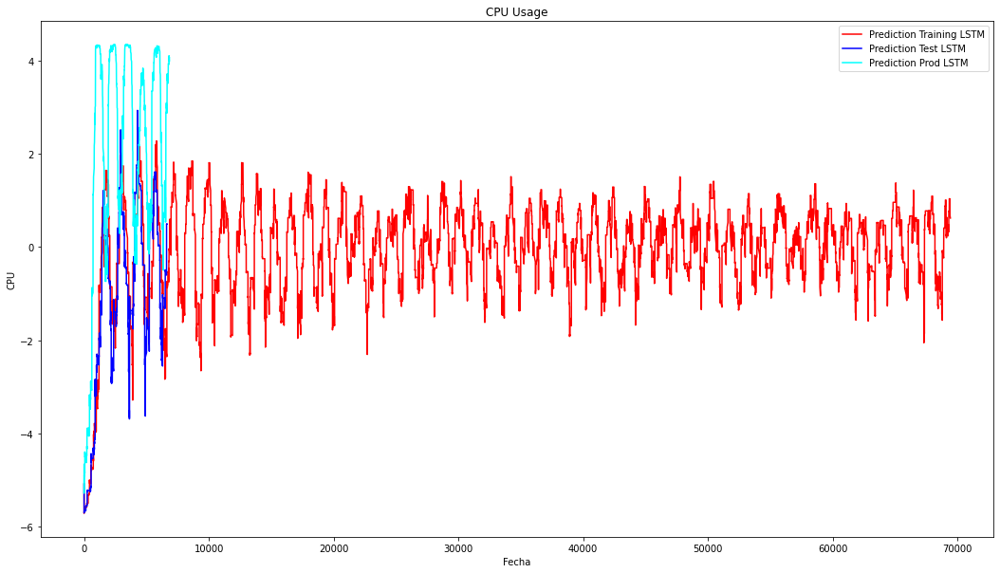

In [32]:
import matplotlib.pyplot as plt
f = plt.figure()
f.set_figwidth(18)
f.set_figheight(10)
plt.plot(res_train, color = 'red', label = 'Prediction Training LSTM')
plt.plot(res_valid, color = 'blue', label = 'Prediction Test LSTM')
plt.plot(res_prod, color = 'cyan', label = 'Prediction Prod LSTM')
plt.title("CPU Usage")
plt.xlabel("Fecha")
plt.ylabel("CPU")
plt.legend()
plt.show()